In [2]:
import pandas as pd
import numpy as np
import os
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
warnings.filterwarnings('ignore')

from japanmap import picture
from ydata_profiling import ProfileReport

In [3]:
prefecture_code = pd.read_csv("japan_housing_data/prefecture_code.csv")
prefecture_code.head()

,Code,JpName,EnName
0,1,北海道,Hokkaido
1,2,青森県,Aomori
2,3,岩手県,Iwate
3,4,宮城県,Miyagi
4,5,秋田県,Akita


In [4]:
df = pd.DataFrame()

data_dir = "japan_housing_data/trade_prices"

for f in os.listdir(data_dir):
    df_prefecture = pd.read_csv(os.path.join(data_dir, f), low_memory=False)
    df_prefecture["Code"] = int(f.split(".")[0])
    df = pd.concat([df, df_prefecture])

df.head()

,No,Type,Region,MunicipalityCode,Prefecture,Municipality,DistrictName,NearestStation,TimeToNearestStation,MinTimeToNearestStation,...,Breadth,CityPlanning,CoverageRatio,FloorAreaRatio,Period,Year,Quarter,Renovation,Remarks,Code
0,1,Residential Land(Land Only),Residential Area,40101,Fukuoka Prefecture,"Moji Ward,Kitakyushu City",Aobadai,Moji,30-60minutes,30.0,...,4.0,Category I Exclusively Low-story Residential Zone,50.0,80.0,4th quarter 2017,2017,4,NaN,NaN,40
1,2,Residential Land(Land Only),Residential Area,40101,Fukuoka Prefecture,"Moji Ward,Kitakyushu City",Oaza Ikawa,Komorie,30-60minutes,30.0,...,4.0,Urbanization Control Area,NaN,NaN,1st quarter 2018,2018,1,NaN,NaN,40
2,3,Residential Land(Land Only),Residential Area,40101,Fukuoka Prefecture,"Moji Ward,Kitakyushu City",Oaza Ikawa,Moji,1H-1H30,60.0,...,4.0,Urbanization Control Area,NaN,NaN,4th quarter 2017,2017,4,NaN,NaN,40
3,4,Residential Land(Land Only),Residential Area,40101,Fukuoka Prefecture,"Moji Ward,Kitakyushu City",Oaza Ikawa,Moji,1H-1H30,60.0,...,35.0,Urbanization Control Area,70.0,200.0,4th quarter 2016,2016,4,NaN,NaN,40
4,5,Residential Land(Land Only),Residential Area,40101,Fukuoka Prefecture,"Moji Ward,Kitakyushu City",Oaza Ikawa,Moji,1H-1H30,60.0,...,NaN,Urbanization Control Area,70.0,200.0,3rd quarter 2016,2016,3,NaN,NaN,40


In [5]:
df = pd.merge(left=df, right=prefecture_code, left_on="Code", right_on="Code", how="left")
df.head()

,No,Type,Region,MunicipalityCode,Prefecture,Municipality,DistrictName,NearestStation,TimeToNearestStation,MinTimeToNearestStation,...,CoverageRatio,FloorAreaRatio,Period,Year,Quarter,Renovation,Remarks,Code,JpName,EnName
0,1,Residential Land(Land Only),Residential Area,40101,Fukuoka Prefecture,"Moji Ward,Kitakyushu City",Aobadai,Moji,30-60minutes,30.0,...,50.0,80.0,4th quarter 2017,2017,4,NaN,NaN,40,福岡県,Fukuoka
1,2,Residential Land(Land Only),Residential Area,40101,Fukuoka Prefecture,"Moji Ward,Kitakyushu City",Oaza Ikawa,Komorie,30-60minutes,30.0,...,NaN,NaN,1st quarter 2018,2018,1,NaN,NaN,40,福岡県,Fukuoka
2,3,Residential Land(Land Only),Residential Area,40101,Fukuoka Prefecture,"Moji Ward,Kitakyushu City",Oaza Ikawa,Moji,1H-1H30,60.0,...,NaN,NaN,4th quarter 2017,2017,4,NaN,NaN,40,福岡県,Fukuoka
3,4,Residential Land(Land Only),Residential Area,40101,Fukuoka Prefecture,"Moji Ward,Kitakyushu City",Oaza Ikawa,Moji,1H-1H30,60.0,...,70.0,200.0,4th quarter 2016,2016,4,NaN,NaN,40,福岡県,Fukuoka
4,5,Residential Land(Land Only),Residential Area,40101,Fukuoka Prefecture,"Moji Ward,Kitakyushu City",Oaza Ikawa,Moji,1H-1H30,60.0,...,70.0,200.0,3rd quarter 2016,2016,3,NaN,NaN,40,福岡県,Fukuoka


In [6]:
df.columns

Index(['No', 'Type', 'Region', 'MunicipalityCode', 'Prefecture',
       'Municipality', 'DistrictName', 'NearestStation',
       'TimeToNearestStation', 'MinTimeToNearestStation',
       'MaxTimeToNearestStation', 'TradePrice', 'FloorPlan', 'Area',
       'AreaIsGreaterFlag', 'UnitPrice', 'PricePerTsubo', 'LandShape',
       'Frontage', 'FrontageIsGreaterFlag', 'TotalFloorArea',
       'TotalFloorAreaIsGreaterFlag', 'BuildingYear', 'PrewarBuilding',
       'Structure', 'Use', 'Purpose', 'Direction', 'Classification', 'Breadth',
       'CityPlanning', 'CoverageRatio', 'FloorAreaRatio', 'Period', 'Year',
       'Quarter', 'Renovation', 'Remarks', 'Code', 'JpName', 'EnName'],
      dtype='object')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3906518 entries, 0 to 3906517
Data columns (total 41 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   No                           int64  
 1   Type                         object 
 2   Region                       object 
 3   MunicipalityCode             int64  
 4   Prefecture                   object 
 5   Municipality                 object 
 6   DistrictName                 object 
 7   NearestStation               object 
 8   TimeToNearestStation         object 
 9   MinTimeToNearestStation      float64
 10  MaxTimeToNearestStation      float64
 11  TradePrice                   int64  
 12  FloorPlan                    object 
 13  Area                         int64  
 14  AreaIsGreaterFlag            int64  
 15  UnitPrice                    float64
 16  PricePerTsubo                float64
 17  LandShape                    object 
 18  Frontage                     float64
 19  

In [8]:
df.describe().apply(lambda s: s.apply('{0:.1f}'.format))  

,No,MunicipalityCode,MinTimeToNearestStation,MaxTimeToNearestStation,TradePrice,Area,AreaIsGreaterFlag,UnitPrice,PricePerTsubo,Frontage,TotalFloorArea,TotalFloorAreaIsGreaterFlag,BuildingYear,PrewarBuilding,Breadth,CoverageRatio,FloorAreaRatio,Year,Quarter,Code
count,3906518.0,3906518.0,3315977.0,3228071.0,3906518.0,3906518.0,3906518.0,1384415.0,1384415.0,2537063.0,1317660.0,3906518.0,1869804.0,3906518.0,2685837.0,3191877.0,3191877.0,3906518.0,3906518.0,3906518.0
mean,78354.1,20467.1,22.6,27.4,27605894.6,467.4,0.0,85148.9,281406.5,14.6,175.2,0.0,1995.5,0.0,6.8,61.0,209.0,2012.9,2.5,20.3
std,80173.6,12175.5,23.1,27.7,141745961.4,847.7,0.2,168683.2,557031.6,9.8,256.4,0.1,15.2,0.0,4.6,10.0,107.5,3.7,1.1,12.2
min,1.0,1101.0,0.0,0.0,100.0,10.0,0.0,1.0,2.0,0.1,10.0,0.0,1945.0,0.0,1.0,30.0,50.0,2005.0,1.0,1.0
25%,20780.0,12204.0,9.0,8.0,5000000.0,100.0,0.0,16000.0,55000.0,8.5,95.0,0.0,1984.0,0.0,4.0,60.0,200.0,2010.0,2.0,12.0
50%,48159.0,17210.0,16.0,15.0,14000000.0,185.0,0.0,40000.0,130000.0,12.0,105.0,0.0,1996.0,0.0,6.0,60.0,200.0,2013.0,3.0,17.0
75%,114733.0,28110.0,30.0,29.0,29000000.0,370.0,0.0,91000.0,300000.0,17.0,140.0,0.0,2009.0,0.0,7.0,60.0,200.0,2016.0,4.0,28.0
max,406575.0,47382.0,120.0,120.0,61000000000.0,5000.0,1.0,20000000.0,66000000.0,50.0,2000.0,1.0,2020.0,1.0,99.9,80.0,1300.0,2019.0,4.0,47.0


In [9]:
avg_prices = df.groupby(['Code', 'JpName', 'EnName', 'Region'])['TradePrice'].mean().reset_index()
avg_prices

,Code,JpName,EnName,Region,TradePrice
0,1,北海道,Hokkaido,Commercial Area,6.618462e+07
1,1,北海道,Hokkaido,Industrial Area,4.914401e+07
2,1,北海道,Hokkaido,Potential Residential Area,3.354823e+07
3,1,北海道,Hokkaido,Residential Area,1.539667e+07
4,2,青森県,Aomori,Commercial Area,2.783249e+07
...,...,...,...,...,...
183,46,鹿児島県,Kagoshima,Residential Area,1.335360e+07
184,47,沖縄県,Okinawa,Commercial Area,7.702567e+07
185,47,沖縄県,Okinawa,Industrial Area,1.395168e+08
186,47,沖縄県,Okinawa,Potential Residential Area,1.932077e+07


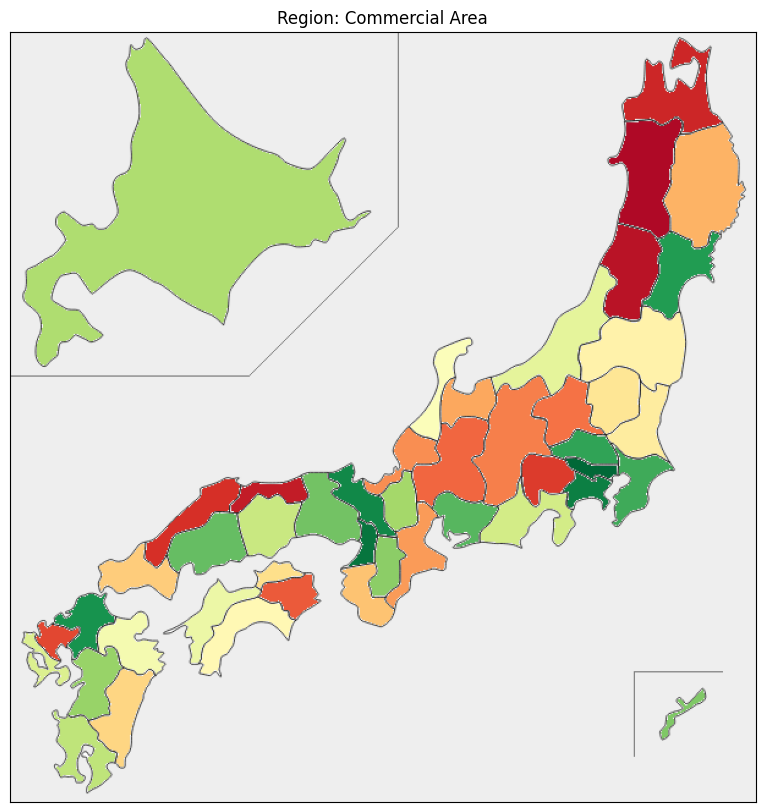

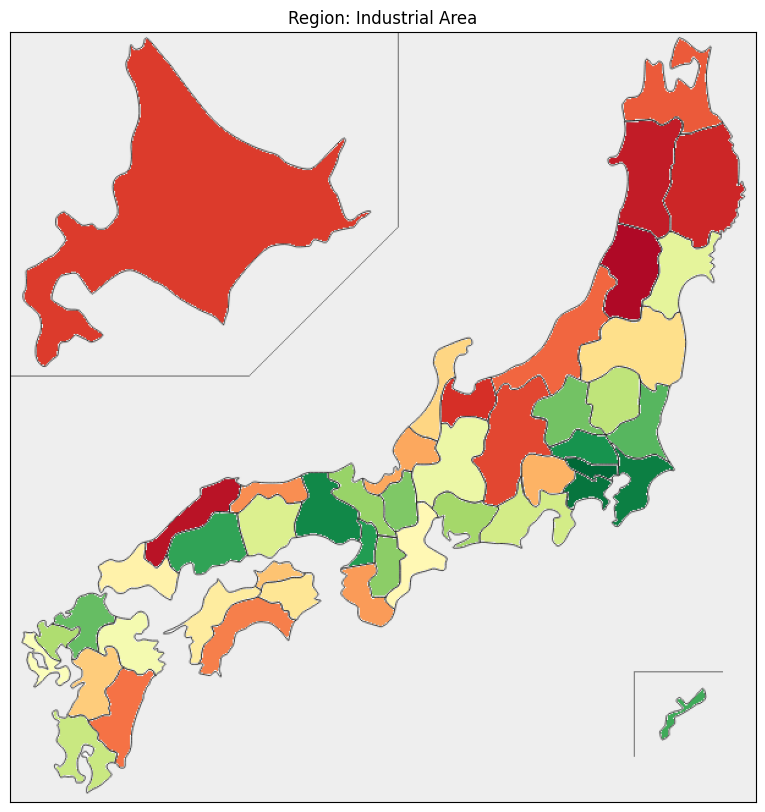

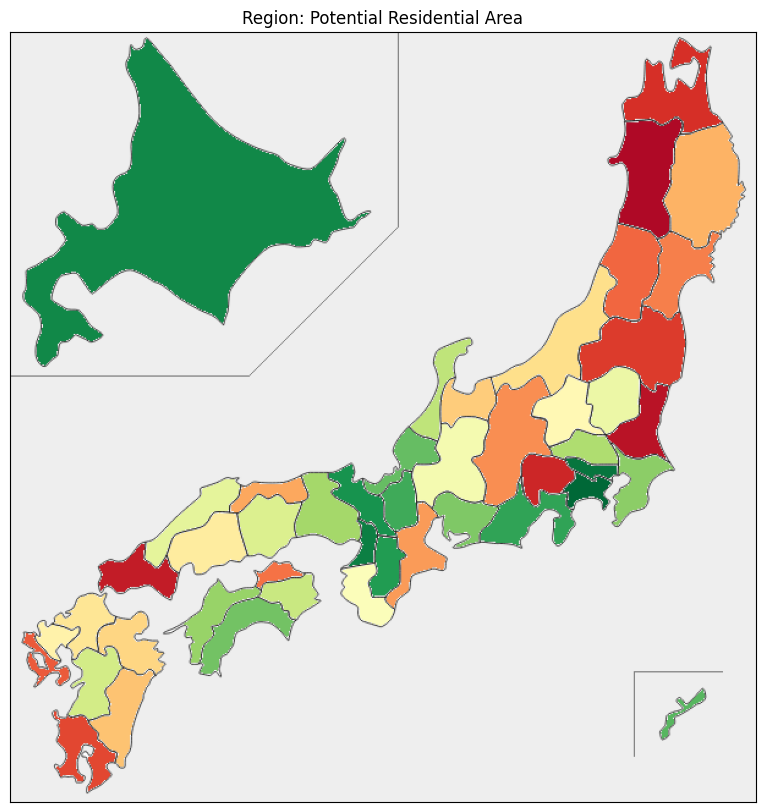

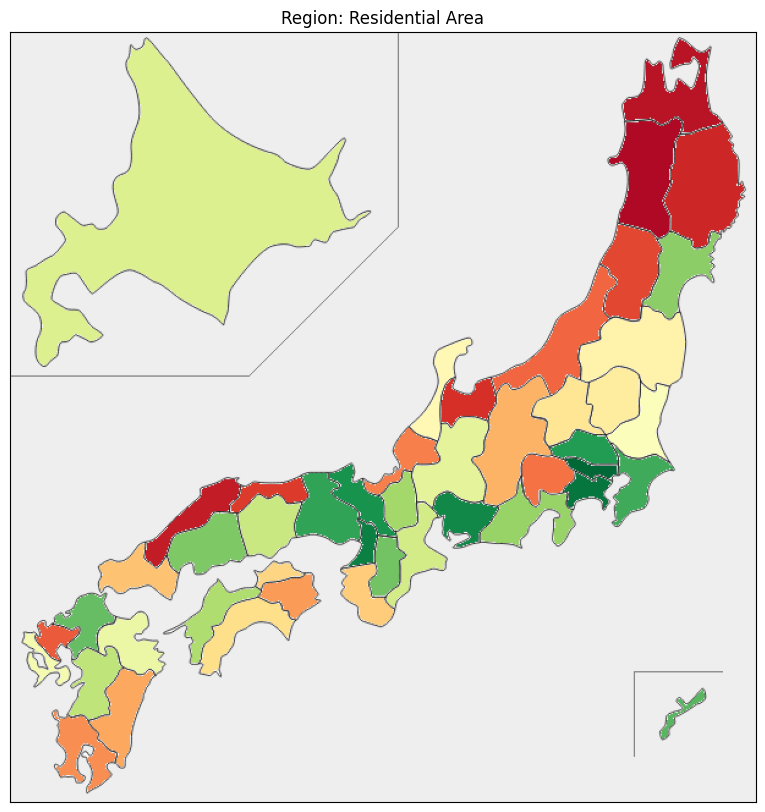

In [10]:
for region in avg_prices.Region.unique():
    df_aux = avg_prices[avg_prices["Region"] == region].copy()
    df_aux['Percentile'] = [int(x) for x in (df_aux.TradePrice.rank(pct=True) * 100)]
    
    cmap = plt.cm.get_cmap('RdYlGn')

    n_colors = 101
    values = np.linspace(0, 1, n_colors)

    colors = [mcolors.to_hex(cmap(value)) for value in values]

    pref_color_dict = {row["JpName"]: colors[row["Percentile"]] for _, row in df_aux.iterrows()}
    plt.figure(figsize=(10, 10))
    plt.title(f"Region: {region}")
    plt.xticks([])
    plt.yticks([])
    plt.imshow(picture(pref_color_dict))

I'm approaching this challenge as a potential house vendor. The prefectures in green are the areas with the biggest TradePrice and the areas in red are the one with the lowest

In [24]:
relevant_features = [
    "Type", "Region", "Prefecture","MinTimeToNearestStation", 
    "MaxTimeToNearestStation", "TradePrice","Area", "UnitPrice",
    "TotalFloorArea", "BuildingYear","Structure", "Purpose", 
    "Direction", "Classification", "CityPlanning","CoverageRatio", 
    "FloorAreaRatio","Year", "Quarter", "Code", "JpName", "EnName"
]

In [25]:
df = df[relevant_features]

In [26]:
df['UnitPrice'] = df['UnitPrice'].fillna(df['TradePrice'] / df['Area'])

In [27]:
df['EnName'] = df['EnName'].apply(lambda x: x.rstrip())

In [28]:
missing_percentage = (df.isnull().mean() * 100).sort_values(ascending=False)
print("Missing percentage\n")
print(missing_percentage)

Missing percentage

Purpose                    69.722960
TotalFloorArea             66.270218
BuildingYear               52.136301
Structure                  51.041490
Classification             30.514719
Direction                  28.901646
Region                     28.595209
FloorAreaRatio             18.293555
CoverageRatio              18.293555
MaxTimeToNearestStation    17.367052
MinTimeToNearestStation    15.116812
CityPlanning               13.584118
JpName                      0.000000
Code                        0.000000
Quarter                     0.000000
Year                        0.000000
Type                        0.000000
UnitPrice                   0.000000
Area                        0.000000
TradePrice                  0.000000
Prefecture                  0.000000
EnName                      0.000000
dtype: float64


In [39]:
df = df.drop('Purpose', axis=1)

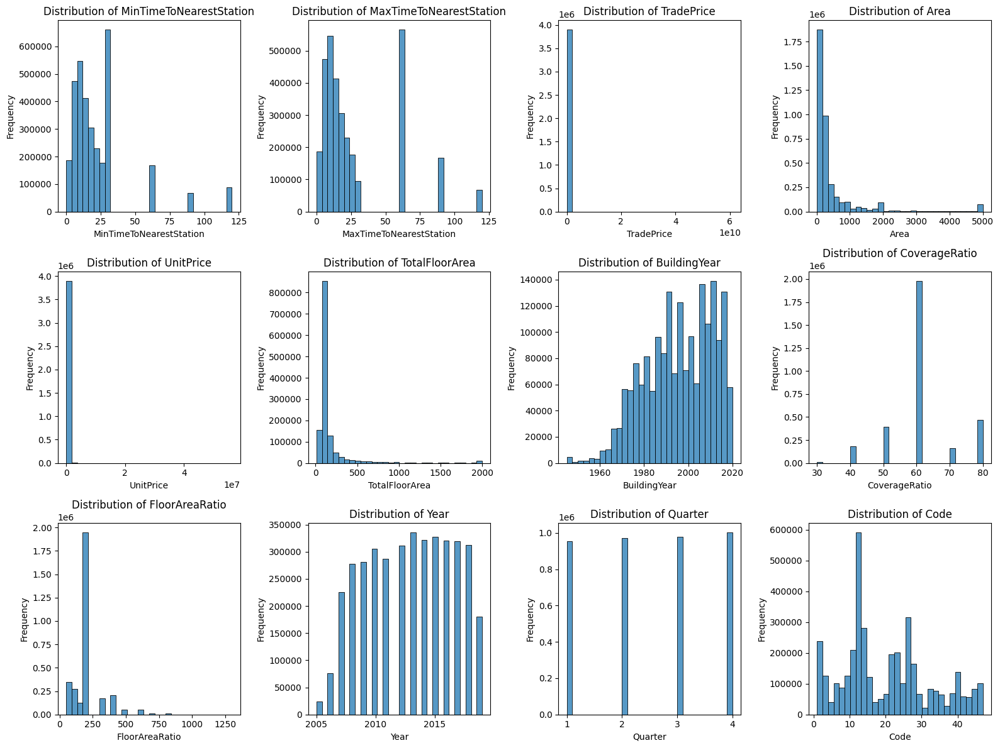

In [29]:
numerical_columns = df.select_dtypes(include=['number']).columns

num_plots = len(numerical_columns)
cols = 4
rows = (num_plots + cols -1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(16, rows * 4))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    sns.histplot(df[col], kde=False, bins=30, ax=axes[i])
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

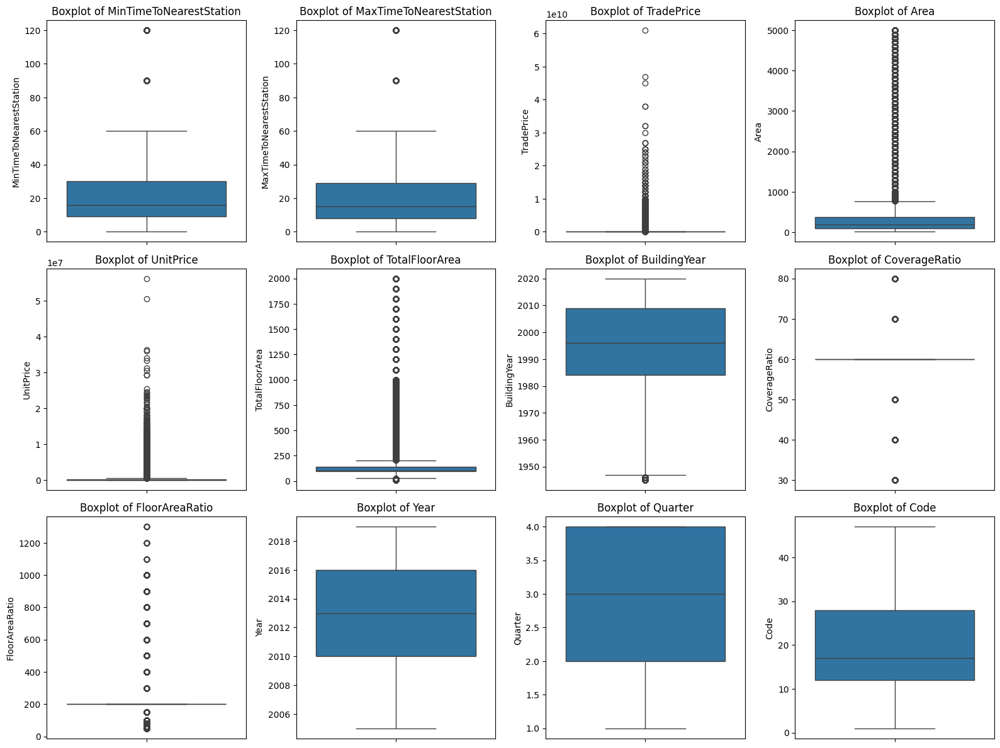

In [30]:
numerical_columns = df.select_dtypes(include=['number']).columns

num_plots = len(numerical_columns)
cols = 4
rows = (num_plots + cols -1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(16, rows * 4))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    sns.boxplot(df[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    # axes[i].set_xlabel(col)
    axes[i].set_ylabel(col)

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

In [ ]:
# I want to check what happens to TradePrice without extreme values

Q1 = df["TradePrice"].quantile(0.25)  
Q3 = df["TradePrice"].quantile(0.75) 
IQR = Q3 - Q1  

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df_no_outliers = df[(df["TradePrice"] >= lower_bound) & (df["TradePrice"] <= upper_bound)]


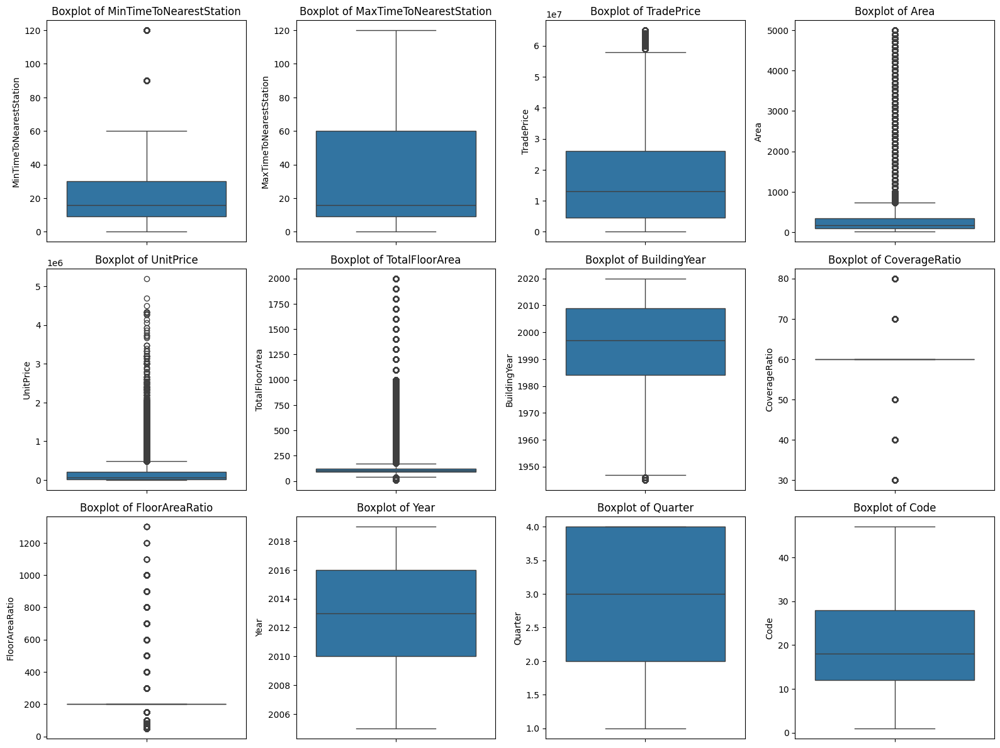

In [ ]:
numerical_columns = df_no_outliers.select_dtypes(include=['number']).columns

num_plots = len(numerical_columns)
cols = 4
rows = (num_plots + cols -1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(16, rows * 4))
axes = axes.flatten()

for i, col in enumerate(numerical_columns):
    sns.boxplot(df_no_outliers[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_ylabel(col)

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

In [ ]:
categorical_columns = df_no_outliers.select_dtypes(include=['object']).columns
for col in categorical_columns:
    print(f"{col} has {df[col].nunique()} unique values")

In [ ]:
profile = ProfileReport(df, title='Profiling Report')
profile